<div dir='ltr'>
<h1>
1. Image Fundamentals
</h1>
</div> 
<hr/>
<div dir='ltr'font-size='20'><font size=4>
This section has three parts. first exercise is about quantization with different levels with and without histogram equalization and compare the differences.
</font></div> 
<br/>
<div dir='ltr'font-size='20'><font size=4>
Second exercise is about downsampling using 2 approches(averaging - remove row&col) and then unsampling using 2 approches(pixel replication - bilinear interplolation).
</font></div> 
<br/>
<div dir='ltr'font-size='20'><font size=4>
Third exercise is to show Elaine image with diffrenet bit planes.
</font></div> 
<br/>
<div dir='ltr'font-size='20'><font size=4>
First we load datasets and import libraries.
</font></div> 

In [1]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1Xmy1Iq9fOc7v7Kh5iUwDSYf47-HD47Ld' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1Xmy1Iq9fOc7v7Kh5iUwDSYf47-HD47Ld" -O Barbara.bmp && rm -rf /tmp/cookies.txt

--2022-11-17 10:12:32--  https://docs.google.com/uc?export=download&confirm=&id=1Xmy1Iq9fOc7v7Kh5iUwDSYf47-HD47Ld
Resolving docs.google.com (docs.google.com)... 172.253.119.101, 172.253.119.139, 172.253.119.138, ...
Connecting to docs.google.com (docs.google.com)|172.253.119.101|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-04-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/sbdskusfk05lif0s08pq2mlvfhbhqe18/1668679950000/01865608280713457520/*/1Xmy1Iq9fOc7v7Kh5iUwDSYf47-HD47Ld?e=download&uuid=7b1df649-0359-48cc-8244-a5626d4c0bb6 [following]
--2022-11-17 10:12:32--  https://doc-04-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/sbdskusfk05lif0s08pq2mlvfhbhqe18/1668679950000/01865608280713457520/*/1Xmy1Iq9fOc7v7Kh5iUwDSYf47-HD47Ld?e=download&uuid=7b1df649-0359-48cc-8244-a5626d4c0bb6
Resolving doc-04-64-docs.googleusercontent.com (doc-04-64-docs.googleusercontent.com)... 173.194.194.1

In [2]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1xA3CeTvPu7Mw2Bwf12SdVp8yyrgdowbw' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1xA3CeTvPu7Mw2Bwf12SdVp8yyrgdowbw" -O CameraMan.bmp && rm -rf /tmp/cookies.txt

--2022-11-17 10:12:33--  https://docs.google.com/uc?export=download&confirm=&id=1xA3CeTvPu7Mw2Bwf12SdVp8yyrgdowbw
Resolving docs.google.com (docs.google.com)... 172.253.119.101, 172.253.119.139, 172.253.119.138, ...
Connecting to docs.google.com (docs.google.com)|172.253.119.101|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-08-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/bfeae9idf93fjidjkejk16vgff7qkj9n/1668679950000/01865608280713457520/*/1xA3CeTvPu7Mw2Bwf12SdVp8yyrgdowbw?e=download&uuid=f041bf86-fd45-4654-aabb-fc72479bb52d [following]
--2022-11-17 10:12:34--  https://doc-08-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/bfeae9idf93fjidjkejk16vgff7qkj9n/1668679950000/01865608280713457520/*/1xA3CeTvPu7Mw2Bwf12SdVp8yyrgdowbw?e=download&uuid=f041bf86-fd45-4654-aabb-fc72479bb52d
Resolving doc-08-64-docs.googleusercontent.com (doc-08-64-docs.googleusercontent.com)... 173.194.194.1

In [3]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1rGXLBAo_NWvDbLCpAdE2n9tJpsd7J8yi' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1rGXLBAo_NWvDbLCpAdE2n9tJpsd7J8yi" -O Elaine.bmp && rm -rf /tmp/cookies.txt

--2022-11-17 10:12:35--  https://docs.google.com/uc?export=download&confirm=&id=1rGXLBAo_NWvDbLCpAdE2n9tJpsd7J8yi
Resolving docs.google.com (docs.google.com)... 172.253.119.101, 172.253.119.139, 172.253.119.138, ...
Connecting to docs.google.com (docs.google.com)|172.253.119.101|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-04-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/oukllr3g735beuovda9bbsdetehigrq0/1668679950000/01865608280713457520/*/1rGXLBAo_NWvDbLCpAdE2n9tJpsd7J8yi?e=download&uuid=a5bc61c3-c943-4f95-8724-1fbb666c0935 [following]
--2022-11-17 10:12:35--  https://doc-04-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/oukllr3g735beuovda9bbsdetehigrq0/1668679950000/01865608280713457520/*/1rGXLBAo_NWvDbLCpAdE2n9tJpsd7J8yi?e=download&uuid=a5bc61c3-c943-4f95-8724-1fbb666c0935
Resolving doc-04-64-docs.googleusercontent.com (doc-04-64-docs.googleusercontent.com)... 173.194.194.1

In [4]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=15CfYAaGqSaJ87UbcH6wFD65vWl5RbdbP' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=15CfYAaGqSaJ87UbcH6wFD65vWl5RbdbP" -O Goldhill.bmp && rm -rf /tmp/cookies.txt

--2022-11-17 10:12:36--  https://docs.google.com/uc?export=download&confirm=&id=15CfYAaGqSaJ87UbcH6wFD65vWl5RbdbP
Resolving docs.google.com (docs.google.com)... 172.253.119.101, 172.253.119.139, 172.253.119.138, ...
Connecting to docs.google.com (docs.google.com)|172.253.119.101|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0g-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/tgt8gfq0qlarorip1gdkit52ankm32q0/1668679950000/01865608280713457520/*/15CfYAaGqSaJ87UbcH6wFD65vWl5RbdbP?e=download&uuid=8ce284d5-1e4d-4a75-ac93-e95e31a9fbfe [following]
--2022-11-17 10:12:36--  https://doc-0g-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/tgt8gfq0qlarorip1gdkit52ankm32q0/1668679950000/01865608280713457520/*/15CfYAaGqSaJ87UbcH6wFD65vWl5RbdbP?e=download&uuid=8ce284d5-1e4d-4a75-ac93-e95e31a9fbfe
Resolving doc-0g-64-docs.googleusercontent.com (doc-0g-64-docs.googleusercontent.com)... 173.194.194.1

In [5]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=12ddjWFewn_9m6TiDx3TeyZD5zMB1gZ45' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=12ddjWFewn_9m6TiDx3TeyZD5zMB1gZ45" -O HE1.jpg && rm -rf /tmp/cookies.txt

--2022-11-17 10:12:37--  https://docs.google.com/uc?export=download&confirm=&id=12ddjWFewn_9m6TiDx3TeyZD5zMB1gZ45
Resolving docs.google.com (docs.google.com)... 172.253.119.101, 172.253.119.139, 172.253.119.138, ...
Connecting to docs.google.com (docs.google.com)|172.253.119.101|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0s-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/hhgbcudei9q8bb3anbrgcj4ata2fndkr/1668679950000/01865608280713457520/*/12ddjWFewn_9m6TiDx3TeyZD5zMB1gZ45?e=download&uuid=33ac955e-6d71-4a40-ad7e-ec2d0fa14bcd [following]
--2022-11-17 10:12:37--  https://doc-0s-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/hhgbcudei9q8bb3anbrgcj4ata2fndkr/1668679950000/01865608280713457520/*/12ddjWFewn_9m6TiDx3TeyZD5zMB1gZ45?e=download&uuid=33ac955e-6d71-4a40-ad7e-ec2d0fa14bcd
Resolving doc-0s-64-docs.googleusercontent.com (doc-0s-64-docs.googleusercontent.com)... 173.194.194.1

In [6]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1U4y9LdASJKbYOGbHUNsf2Dg7UXsnjwuH' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1U4y9LdASJKbYOGbHUNsf2Dg7UXsnjwuH" -O HE2.jpg && rm -rf /tmp/cookies.txt

--2022-11-17 10:12:38--  https://docs.google.com/uc?export=download&confirm=&id=1U4y9LdASJKbYOGbHUNsf2Dg7UXsnjwuH
Resolving docs.google.com (docs.google.com)... 172.253.119.101, 172.253.119.139, 172.253.119.138, ...
Connecting to docs.google.com (docs.google.com)|172.253.119.101|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-08-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/l9h2fh6acm06saqniut4rknm2iejpog9/1668679950000/01865608280713457520/*/1U4y9LdASJKbYOGbHUNsf2Dg7UXsnjwuH?e=download&uuid=901b08a1-8981-41cb-8970-64ce370519db [following]
--2022-11-17 10:12:38--  https://doc-08-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/l9h2fh6acm06saqniut4rknm2iejpog9/1668679950000/01865608280713457520/*/1U4y9LdASJKbYOGbHUNsf2Dg7UXsnjwuH?e=download&uuid=901b08a1-8981-41cb-8970-64ce370519db
Resolving doc-08-64-docs.googleusercontent.com (doc-08-64-docs.googleusercontent.com)... 173.194.194.1

In [7]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1I3F4slwJDHnyb0yhO6Ja0Ja82bzkszKa' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1I3F4slwJDHnyb0yhO6Ja0Ja82bzkszKa" -O HE3.jpg && rm -rf /tmp/cookies.txt

--2022-11-17 10:12:39--  https://docs.google.com/uc?export=download&confirm=&id=1I3F4slwJDHnyb0yhO6Ja0Ja82bzkszKa
Resolving docs.google.com (docs.google.com)... 172.253.119.101, 172.253.119.139, 172.253.119.138, ...
Connecting to docs.google.com (docs.google.com)|172.253.119.101|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0s-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/rkfmb933574el82gjkqq7s2tc93sl7na/1668679950000/01865608280713457520/*/1I3F4slwJDHnyb0yhO6Ja0Ja82bzkszKa?e=download&uuid=b81eb92a-acf7-403f-9f54-168c84e93b28 [following]
--2022-11-17 10:12:40--  https://doc-0s-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/rkfmb933574el82gjkqq7s2tc93sl7na/1668679950000/01865608280713457520/*/1I3F4slwJDHnyb0yhO6Ja0Ja82bzkszKa?e=download&uuid=b81eb92a-acf7-403f-9f54-168c84e93b28
Resolving doc-0s-64-docs.googleusercontent.com (doc-0s-64-docs.googleusercontent.com)... 173.194.194.1

In [8]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1Ma8al4t585FOhw59kd8vCNYw9PVZH68p' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1Ma8al4t585FOhw59kd8vCNYw9PVZH68p" -O HE4.jpg && rm -rf /tmp/cookies.txt

--2022-11-17 10:12:41--  https://docs.google.com/uc?export=download&confirm=&id=1Ma8al4t585FOhw59kd8vCNYw9PVZH68p
Resolving docs.google.com (docs.google.com)... 172.253.119.101, 172.253.119.139, 172.253.119.138, ...
Connecting to docs.google.com (docs.google.com)|172.253.119.101|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0c-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/ilfu9ohqcn8i2gsh7sc3e2ojk1j29ra2/1668679950000/01865608280713457520/*/1Ma8al4t585FOhw59kd8vCNYw9PVZH68p?e=download&uuid=62664717-7860-4047-b620-3b7c816a127b [following]
--2022-11-17 10:12:41--  https://doc-0c-64-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/ilfu9ohqcn8i2gsh7sc3e2ojk1j29ra2/1668679950000/01865608280713457520/*/1Ma8al4t585FOhw59kd8vCNYw9PVZH68p?e=download&uuid=62664717-7860-4047-b620-3b7c816a127b
Resolving doc-0c-64-docs.googleusercontent.com (doc-0c-64-docs.googleusercontent.com)... 173.194.194.1

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn
import cv2
from math import *

<div dir='ltr'>
<h2>
1.1. Quantization & Interpolation
</h2>
</div> 

<div dir='ltr'>
<h3>
1.1.1.
</h3>
</div> 
<hr/>


<div dir='ltr'font-size='30px'><font size=4>
First Elaine image is quantized in 4,8,16,32,64,128 levels.
the algorithm for quantization is to first get the final gray levels(n_final_gray_levels).
consider 2^k = (256/n_final_gray_levels) so k is the amount of bits that we have to shift image to right to have n_final_gray_levels of quantization.
by img / (256/n_final_gray_levels) we actually shift img k bits to right.
we have n_final_gray_levels of quantization level.now we have to map this gray levels to 0-255. to do this we multiply output image by np.floor(255/(n_final_gray_levels -1 )).
</font></div> 
</br>
<div dir='ltr'font-size='30px'><font size=4>
For example to have 32 gray levels(5 quantization bits). by img/(256/32), we shift image 3 bits to the right to just have 5 quantization bits and therefore have 32 grayscales. now every gray level values are between 0-31, to map these numbers to 0-255, we have to multiple image by 255/32 which can be calculated by np.floor(255/(n_final_gray_levels -1 )) </font></div>


In [10]:
def Quantize(img,n_final_gray_levels):
  output= np.floor(img / (256/n_final_gray_levels))
  output= output * np.floor(255/(n_final_gray_levels -1 ))
  return output

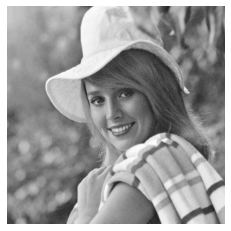

In [11]:
img=cv2.imread('Elaine.bmp',cv2.IMREAD_GRAYSCALE)
plt.imshow(img,cmap='gray')
plt.axis('off')
plt.show()

In [12]:
#Quantize with 4 8 16 32 64 128 gray levels:
img_4=Quantize(img,4) 
img_8=Quantize(img,8)
img_16=Quantize(img,16)
img_32=Quantize(img,32)
img_64=Quantize(img,64)
img_128=Quantize(img,128)

<div dir='ltr'font-size='20'><font size=4>
plot grid is a function that takes images as input and a list of quntization levels. it first shows each image and then calls np.histogram to compute histigram of images and plot histograms as well. plot grid uses quntization levels for number of bins in calculating histograms.
</font></div> 

In [13]:
def plot_grid(*args, figsize=10,title=None, fontsize=12,quan_levels=[4,8,16,32,64,128]):
    figsize = (3*figsize, figsize)
    #figsize = (figsize, figsize)
    images =list(args)
    fig=plt.figure(figsize=figsize)
    for i in range(1, len(images)+1):
        
        fig.add_subplot(2, len(images), i)
        if title is not None:
            plt.title(title[i-1], fontsize=fontsize)
        plt.imshow(images[i-1],cmap='gray')
        plt.axis('off')

        ## plot histograms: 
        if quan_levels != None:
          fig.add_subplot(2, len(images), i+len(images))
          img_hist=np.histogram(images[i-1].ravel(),quan_levels[i-1])
          plt.bar(np.linspace(0,255,quan_levels[i-1]),img_hist[0],width=2)

<div dir='ltr'>
<h3>
Results of quantization without histogram equalization on image
</h3>
</div> 
<hr/>
<div dir='ltr'size=10><font size=4>
By using more bits as quantization bits it is shown that we can see a broader range of gray values in image and the image has more quality. cause by using more gray levels, contrast(variance) as well as quality of image is going to increase.
</font></div> 

<br/>
<div dir='ltr'size=10><font size=4>
In histograms, number of bins is equal to number of quantization levels.
</font></div> 

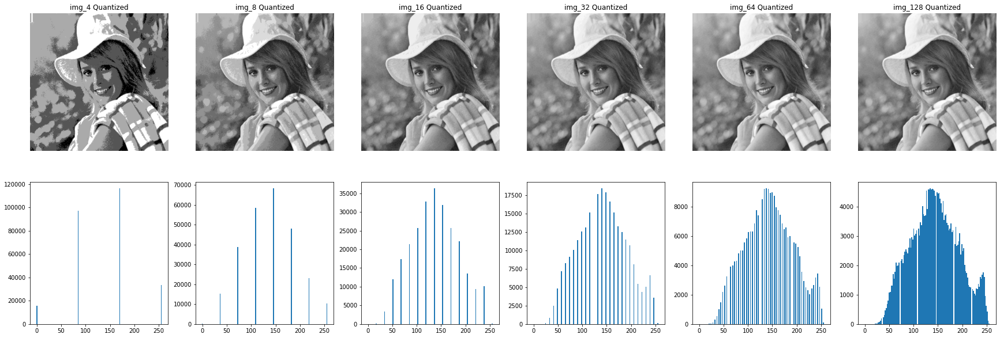

In [14]:
titles=['img_4 Quantized','img_8 Quantized','img_16 Quantized','img_32 Quantized','img_64 Quantized','img_128 Quantized']
plot_grid(img_4,img_8,img_16,img_32,img_64,img_128,title=titles,quan_levels=[4,8,16,32,64,128])

<div dir='ltr'>
<h3>MSE Function
</h3>
</div> 
<hr/>
<div dir='ltr'size=10><font size=4>
Mean squared error computes difference between two images by averaging of squared difference between pixels of two images. 
</font></div> 


In [15]:
def mse(img1,img2):
  pic_1=img1.copy().ravel()
  pic_2=img2.copy().ravel()
  sqr_diff=(pic_1 - pic_2)**2
  size=pic_1.shape[0]
  err = np.sum(sqr_diff) / size
  return err
 

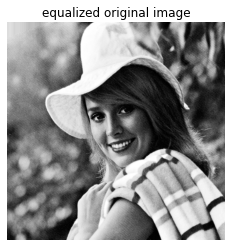

In [16]:
img_equ = cv2.equalizeHist(img)
plt.imshow(img_equ,cmap='gray')
plt.title('equalized original image', fontsize=12)
plt.axis('off')
plt.show()

<div dir='ltr'>
<h3>
Results of quantization with histogram equalization on image
</h3>
</div> 
<hr/>
<div dir='ltr'size=10><font size=4>
Same as quantization without histogram equalization by using more bits as quantization bits it is shown that we can see a broader range of gray values in image and the image has more quality. cause by using more gray levels, contrast(variance) as well as quality of image is going to increase.
</font></div> 

<br/>
<div dir='ltr'size=10><font size=4>
In histograms, number of bins is equal to number of quantization levels.
</font></div> 
</br>
<div dir='ltr'size=10><font size=4>
The diffrence between with or without equalization is that, cause equlization tries to change the intensity values in a way that the corresponding histigram has the uniform distrebution when we apply quantization on equalized image, the corresponding histograms have same horizontal axis as histograms before equalization but the y- axis is different. y axis in histograms after equalization are really close to uniform function(because of equalization) but y axis in histograms without equalization areen't uniform.
</font></div> 

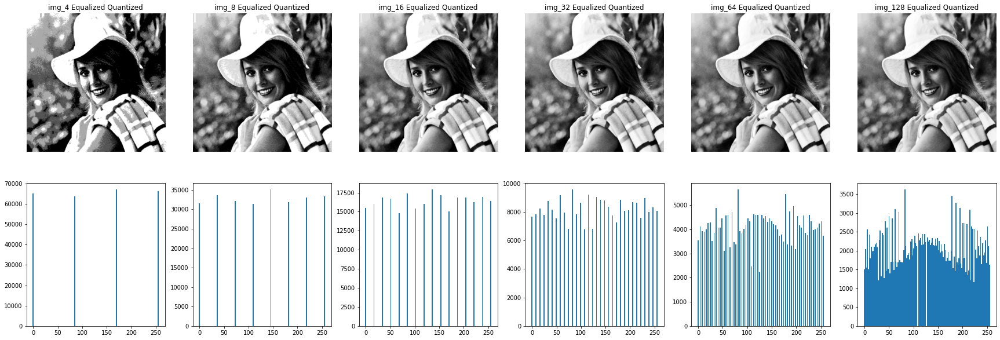

In [17]:
img_4_equ=Quantize(img_equ,4)
img_8_equ=Quantize(img_equ,8)
img_16_equ=Quantize(img_equ,16)
img_32_equ=Quantize(img_equ,32)
img_64_equ=Quantize(img_equ,64)
img_128_equ=Quantize(img_equ,128)
plot_grid(img_4_equ,img_8_equ,img_16_equ,img_32_equ,img_64_equ,img_128_equ, title=['img_4 Equalized Quantized','img_8 Equalized Quantized','img_16 Equalized Quantized','img_32 Equalized Quantized','img_64 Equalized Quantized','img_128 Equalized Quantized'])

<div dir='ltr'>
<h3>
Results of mse on quantized image with and without histogram equalization and original image
</h3>
</div> 
<hr/>
<div dir='ltr'size=10><font size=4>
comparision between with and without equalization:
</font></div> 
<br/>
<div dir='ltr'size=10><font size=4>
Mse between original image and quantized without equalization for every quantization level is always less than mse between original image and quantized with equalization for every quantization level. the reason for this is that equalization changes original intensity values to make histogram distrobution close to uniform distrobution. changing  original intensity causes much more mse with original image.
</font></div> 
<br/>
<div dir='ltr'size=10><font size=4>
comparision between different quantization levels in both cases(with or without equalization):
</font></div> 
<br/>
<div dir='ltr'size=10><font size=4>
To compare mse between diffrenet quatized levels without quantization we can see that the least error belongs to quantization with 128 quantization levels.in other word mse is reducing by adding quantization levels. the explanation for this is prettu easy, by adding more quantization levels, we are using more bits for each pixel and ther for number og gray levels increses which causes boost of contrast, increses quality of image and nakes it more similar to the original image which means less mse.this comparison is true for both cases(with or without equalization)
</font></div> 
<br/>
 

In [18]:
#without_histeq
without_histeq_4 = mse(img,img_4)
without_histeq_8 = mse(img,img_8)
without_histeq_16 = mse(img,img_16)
without_histeq_32= mse(img,img_32)
without_histeq_64= mse(img,img_64)
without_histeq_128= mse(img,img_128)

#with_histeq
with_histeq_4 = mse(img,img_4_equ)
with_histeq_8 = mse(img,img_8_equ)
with_histeq_16 = mse(img,img_16_equ)
with_histeq_32= mse(img,img_32_equ)
with_histeq_64= mse(img,img_64_equ)
with_histeq_128= mse(img,img_128_equ)

print('mse:     without_histeq_4 : ',without_histeq_4,'      with_histeq_4 : ',with_histeq_4)
print('mse:     without_histeq_8 : ',without_histeq_8,'      with_histeq_8 : ',with_histeq_8)
print('mse:     without_histeq_16 : ',without_histeq_16,'      with_histeq_16 : ',with_histeq_16)
print('mse:     without_histeq_32: ',without_histeq_32,'      with_histeq_32 : ',with_histeq_32)
print('mse:     without_histeq_64: ',without_histeq_64,'      with_histeq_64: ',with_histeq_64)
print('mse:     without_histeq_128 : ',without_histeq_128,'      with_histeq_128 : ',with_histeq_128)

mse:     without_histeq_4 :  856.5056190490723       with_histeq_4 :  2958.073097229004
mse:     without_histeq_8 :  148.96257781982422       with_histeq_8 :  1573.607536315918
mse:     without_histeq_16 :  32.774803161621094       with_histeq_16 :  1185.7636947631836
mse:     without_histeq_32:  17.381858825683594       with_histeq_32 :  969.5610580444336
mse:     without_histeq_64:  3.4688339233398438       with_histeq_64:  923.7709274291992
mse:     without_histeq_128 :  0.5092544555664062       with_histeq_128 :  901.4598770141602


<div dir='ltr'size=10><font size=4>
Check mse value from sklearn.metrics to check correctness of our mse function. the mse between img and img_4_equ is the same as our result wich means our mse function works just  fine.
</font></div>

In [19]:
# check with sklearn for mse for with_histeq_4 --> mse func is correct
from sklearn.metrics import mean_squared_error
mean_squared_error(img,img_4_equ)

2958.073097229004

<div dir='ltr'>
<h3>
1.1.2.
</h3>
</div> 
<hr/>


<div dir='ltr'font-size='30px'><font size=4>
In this exercise we first downsample goldhill image using averaging and removing row&col. them we upsample the downsampled images and caclulate mse for results.
</font></div> 
</br>
<div dir='ltr'font-size='30px'><font size=4>
First, goldhill omage is loaded.
</font></div> 
</br>



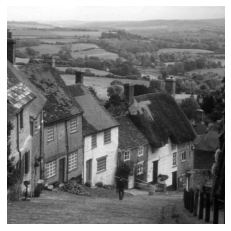

In [20]:
goldhill_img=cv2.imread('Goldhill.bmp',cv2.IMREAD_GRAYSCALE)
plt.imshow(goldhill_img,cmap='gray')
plt.axis('off')
plt.show()

In [21]:
goldhill_img.shape

(512, 512)

<div dir='ltr'>
<h3>avg_downsample Function
</h3>
</div> 
<hr/>
<div dir='ltr'size=10><font size=4>
Averaging downsampling is actually the same as appling a box filter to picture. 
avg_downsample applies box filter to image(averaging).</font></div> 
<br/>
<div dir='ltr'size=10><font size=4>
avg_downsample gets size of window used for averaging or kernel(filter) size k.
cause averging sums all pixel values together and then divides the sum out put by size of pixels in window(k^2), we consider a kernel like box filter by np.ones((k,k)) / (k**2).
</font></div> 
</br>
<div dir='ltr'size=10><font size=4>
consider size of iamge n and size of kernel k, the output size will be floor(n/k). by looping over rows and cols of out put image, we calculate it's value by appling ;ernel to corresponding patch for that pixel.
</font></div> 

In [22]:
def avg_downsample(img,k):
  n=img.shape[0]
  kernel=np.ones((k,k)) / (k**2)
  out_size=floor(img.shape[0]/k)
  out = np.zeros((out_size,out_size))
  for i  in range(0,out_size):
    for j in range(0,out_size):
      patch = img[i*k:(i+1)*k, j*k:(j+1)*k]
      out[i,j] = np.sum(patch * kernel)
  return out

<div dir='ltr'>
<h3>remove_row_col_downsampling Function
</h3>
</div> 
<hr/>
<div dir='ltr'size=10><font size=4>
Gets downsampling factor as input and skip rows and columns by step of factor.</font></div> 
 

In [23]:
def remove_row_col_downsampling(img,factor):
  return img[::factor,::factor]

In [24]:
avg_goldhill_img = avg_downsample(goldhill_img,2)
remove_row_col_goldhill_img = remove_row_col_downsampling(goldhill_img,2)

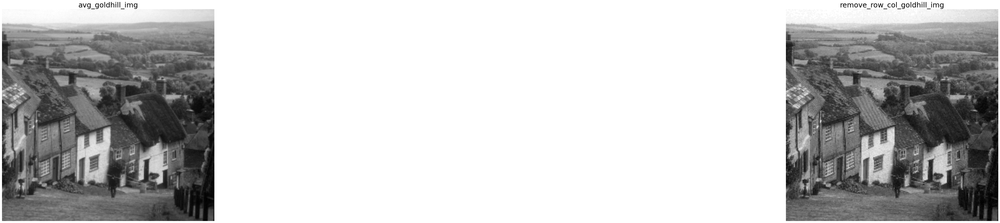

In [25]:
titles=['avg_goldhill_img','remove_row_col_goldhill_img']
plot_grid(avg_goldhill_img,remove_row_col_goldhill_img,figsize=30,fontsize=25,title=titles,quan_levels=None)

<div dir='ltr'>
<h3>unsample_px_replication Function
</h3>
</div> 
<hr/>
<div dir='ltr'size=10><font size=4>
This function is the implementation of interpolation based on pixel replication.in Pixel replication or (Nearest neighbor interpolation), each pixel gets intensity value of it's nearest neighbor.</font></div> 
</br>
<div dir='ltr'size=10><font size=4>
Each pixel is replicated in this method factor(unsampling factor) times times row wise and column wise and you got a zoomed image.</font></div> 
 

In [26]:
def unsample_px_replication(img, factor):
    out = np.repeat(img, factor, axis=0)
    out = np.repeat(out, factor, axis=1)
    return out

<div dir='ltr'>
<h3>bilinear_interpolation_px Function
</h3>
</div> 
<hr/>
<div dir='ltr'size=10><font size=4>
This function is the implementation of interpolation based on pixel replication.in Pixel replication or (Nearest neighbor interpolation), each pixel gets intensity value of it's nearest neighbor.</font></div> 
</br>
<div dir='ltr'size=10><font size=4>
Each pixel is replicated in this method factor(unsampling factor) times times row wise and column wise and you got a zoomed image.</font></div> 
 

In [27]:
def bilinear_interpolation_px(img,row_pos,col_pos):
 
  row_before_pos = floor(row_pos)
  row_after_pos = min(row_before_pos + 1 , img.shape[0]-1) 
  col_before_pos = floor(col_pos)
  col_after_pos = min(col_before_pos + 1 , img.shape[1]-1)

  weights = []
  a = img[row_before_pos , col_before_pos] 
  b = img[row_before_pos , col_after_pos]
  d = img[row_after_pos , col_before_pos]
  c = img[row_after_pos ,col_after_pos ]
# calculate weights
  wa = (row_after_pos - row_pos) * (col_after_pos - col_pos )
  wb = (row_after_pos - row_pos) * (col_pos - col_before_pos )
  wc = (row_pos - row_before_pos) * (col_pos - col_before_pos )
  wd = (row_pos - row_before_pos) * (col_after_pos - col_pos )

  # soert weights
  weights.append(wa)
  weights.append(wb)
  weights.append(wc)
  weights.append(wd)
  weights.sort(reverse=True)


  return weights[0]*a + weights[1]*b + weights[2]*c + weights[3]*d 


# def bilinear_interpolation_px(imArr, posX, posY):
# 	out = []

# 	#Get integer and fractional parts of numbers
# 	modXi = int(posX)
# 	modYi = int(posY)
# 	modXf = posX - modXi
# 	modYf = posY - modYi
# 	modXiPlusOneLim = min(modXi+1,imArr.shape[1]-1)
# 	modYiPlusOneLim = min(modYi+1,imArr.shape[0]-1)

# 	#Get pixels in four corners
	
# 	bl = imArr[modYi, modXi]
# 	br = imArr[modYi, modXiPlusOneLim]
# 	tl = imArr[modYiPlusOneLim, modXi]
# 	tr = imArr[modYiPlusOneLim, modXiPlusOneLim]
	
# 		#Calculate interpolation
# 	b = modXf * br + (1. - modXf) * bl
# 	t = modXf * tr + (1. - modXf) * tl
# 	pxf = modYf * t + (1. - modYf) * b
# 	out = (int(pxf+0.5))

# 	return out

In [28]:
def bilinear_interpolation_img(img,factor):
  out = np.zeros((img.shape[0]*factor ,img.shape[1]*factor ))
  for i in range(0,out.shape[0]):
    for j in range(0,out.shape[1]):
      out[i,j] = bilinear_interpolation_px(img,i/factor,j/factor)
  return out    

In [29]:
bilinear_unsample_avg_img = bilinear_interpolation_img(avg_goldhill_img,2)
bilinear_unsample_remove_row_col_img = bilinear_interpolation_img(remove_row_col_goldhill_img,2)

px_replication_unsample_avg_img = unsample_px_replication(avg_goldhill_img,2)
px_replication_unsample_remove_row_col_img = unsample_px_replication(remove_row_col_goldhill_img,2)

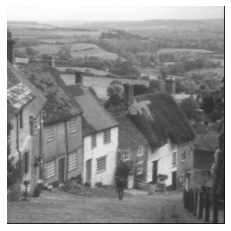

In [30]:
plt.imshow(bilinear_unsample_avg_img,cmap='gray')
plt.axis('off')
plt.show()

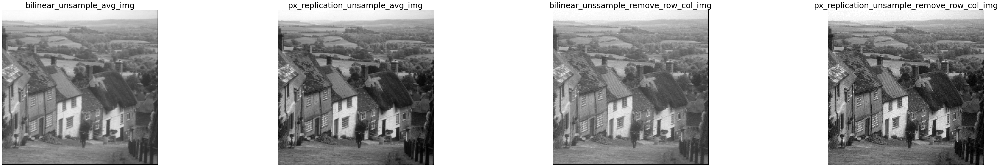

In [31]:
titles=['bilinear_unsample_avg_img','px_replication_unsample_avg_img','bilinear_unssample_remove_row_col_img','px_replication_unsample_remove_row_col_img']
plot_grid(bilinear_unsample_avg_img,px_replication_unsample_avg_img,bilinear_unsample_remove_row_col_img,px_replication_unsample_remove_row_col_img,figsize=20,fontsize=25,title=titles,quan_levels=None)

In [32]:
mse_avg_replication = mse(goldhill_img ,px_replication_unsample_avg_img )
mse_avg_bilinear = mse(goldhill_img,bilinear_unsample_avg_img)
mse_remove_row_col_replication = mse(goldhill_img ,px_replication_unsample_remove_row_col_img )
mse_remove_row_col_bilinear = mse(goldhill_img ,bilinear_unsample_remove_row_col_img )

print('mse :  mse_avg_replication ', mse_avg_replication,'           mse_avg_bilinear:  ',mse_avg_bilinear)
print('mse :  mse_remove_row_col_replication ', mse_remove_row_col_replication,'  mse_remove_row_col_bilinear:  ',mse_remove_row_col_bilinear)

mse :  mse_avg_replication  65.97711181640625            mse_avg_bilinear:   166.95094966888428
mse :  mse_remove_row_col_replication  23.089599609375   mse_remove_row_col_bilinear:   158.96807861328125


1.1.3

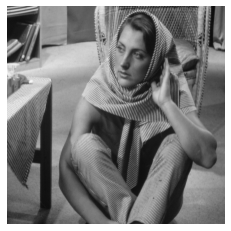

In [33]:
barbara_img=cv2.imread('Barbara.bmp',cv2.IMREAD_GRAYSCALE)
plt.imshow(barbara_img,cmap='gray')
plt.axis('off')
plt.show()

In [34]:
def get_bit_plane(img, k):
    n = 8-k
    res = img >> n
    res = res << n
    return res

In [35]:
def bit_plane(img,bit_plane):
  out = np.zeros((img.shape[0],img.shape[1]))
  for i in range(0,img.shape[0]):
    for j in range(0,img.shape[1]):
      out[i,j] = img[i,j] & bit_plane
  return out

In [36]:
img_bit_plane_76543= bit_plane(barbara_img , 0b11111000) 
img_bit_plane_7654= bit_plane(barbara_img , 0b11110000) 
img_bit_plane_765= bit_plane(barbara_img , 0b11100000) 
img_bit_plane_76= bit_plane(barbara_img , 0b11000000)
img_bit_plane_7= bit_plane(barbara_img , 0b10000000)

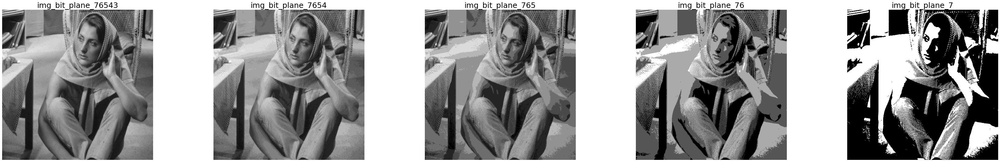

In [37]:
titles=['img_bit_plane_76543','img_bit_plane_7654','img_bit_plane_765','img_bit_plane_76','img_bit_plane_7']
plot_grid(img_bit_plane_76543,img_bit_plane_7654,img_bit_plane_765,img_bit_plane_76,img_bit_plane_7,figsize=20,fontsize=25,title=titles,quan_levels=None)

In [38]:
img_bit_plane_76543= bit_plane(barbara_img , 0b11111000)
img_bit_plane_6543= bit_plane(barbara_img , 0b01111000)
img_bit_plane_543= bit_plane(barbara_img , 0b00111000)
img_bit_plane_43= bit_plane(barbara_img , 0b00011000)
img_bit_plane_3= bit_plane(barbara_img , 0b00001000)

titles=['img_bit_plane_76543','img_bit_plane_6543','img_bit_plane_543','img_bit_plane_43','img_bit_plane_3']
plot_grid(img_bit_plane_76543,img_bit_plane_6543,img_bit_plane_543,img_bit_plane_43,img_bit_plane_3,figsize=20,fontsize=25,title=titles,quan_levels=None)

Output hidden; open in https://colab.research.google.com to view.

In [39]:
img_bit_plane_76543= bit_plane(barbara_img , 0b11111000)
img_bit_plane_7= bit_plane(barbara_img , 0b10000000)
img_bit_plane_6= bit_plane(barbara_img , 0b01000000)
img_bit_plane_5= bit_plane(barbara_img , 0b00100000)
img_bit_plane_4= bit_plane(barbara_img , 0b00010000)
img_bit_plane_3= bit_plane(barbara_img , 0b00001000)

titles=['img_bit_plane_76543','img_bit_plane_7','img_bit_plane_6','img_bit_plane_5','img_bit_plane_4','img_bit_plane_3']
plot_grid(img_bit_plane_76543,img_bit_plane_7,img_bit_plane_6,img_bit_plane_5,img_bit_plane_4,img_bit_plane_3,figsize=20,fontsize=25,title=titles,quan_levels=None)

Output hidden; open in https://colab.research.google.com to view.

In [40]:
# temp 
# images = [goldhill_img]
# titles = ['Original']
# k=2
# kernel = np.ones((k,k), dtype='uint8') / (k*k)
# out = cv2.filter2D(goldhill_img, -1, kernel)
# images.append(out)
# titles.append(f'{k}*{k} Box')
out  = cv2.pyrDown(goldhill_img)

In [41]:
out.shape

(256, 256)

In [42]:
out_1 =  cv2.resize(avg_goldhill_img, (512, 512), interpolation=cv2.INTER_LINEAR)

In [43]:
 mse(goldhill_img ,out_1 )

61.81769633293152

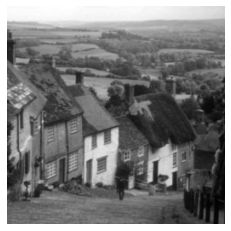

In [44]:
plt.imshow(out,cmap='gray')
plt.axis('off')
plt.show()

2.1.1

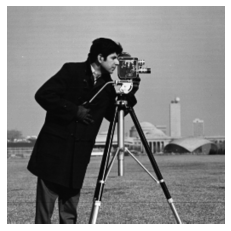

In [45]:
camera_man_img=cv2.imread('CameraMan.bmp',cv2.IMREAD_GRAYSCALE)
plt.imshow(camera_man_img,cmap='gray')
plt.axis('off')
plt.show()

In [46]:
def calculate_histogram(img):
  hist = np.zeros((256))   # kepps counts of each gl (index)
  for i in range(0,img.shape[0]):
    for j in range(0,img.shape[0]):
      hist[img[i,j]]+=1
  return hist

In [47]:
hist_camera_man = calculate_histogram(camera_man_img)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  This is separate from the ipykernel package so we can avoid doing imports until


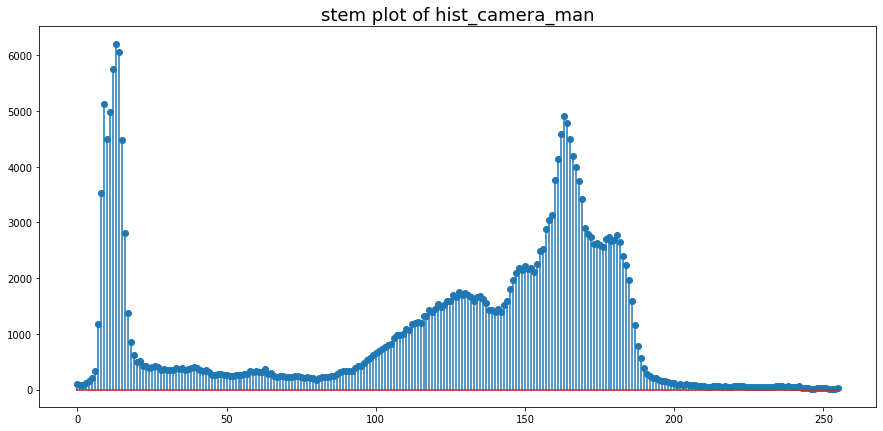

In [48]:
plt.figure(figsize=(15,7))
plt.title('stem plot of hist_camera_man',fontsize=18)
plt.stem(np.linspace(0,255,256),hist_camera_man)
plt.show()

2.1.1.1

In [49]:
def change_intensity(img,change_scale):
  out = img.copy()
  for i in range(0,out.shape[0]):
    for j in range(0,out.shape[1]):
      out[i,j] = max(change_scale*img[i,j],0)
      out[i,j] = min(change_scale*img[i,j],255)

  return out    

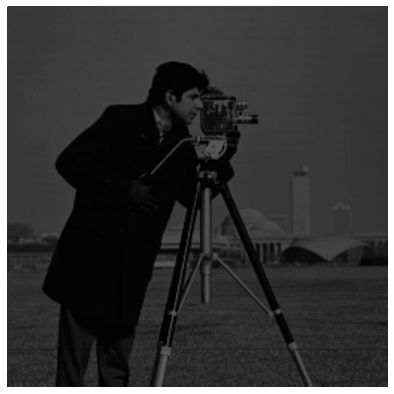

In [50]:
D = change_intensity(camera_man_img , 1/3)
D[0,0]=240
plt.figure(figsize=(7,7))
plt.imshow(D,cmap='gray')
plt.axis('off')
plt.show()

2.1.1.2

In [51]:
hist_darker_camera_man = calculate_histogram(D)

In [52]:
hist_darker_camera_man.shape

(256,)

In [53]:
hist_darker_camera_man.shape[0]
#camera_man_img.shape

256

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  


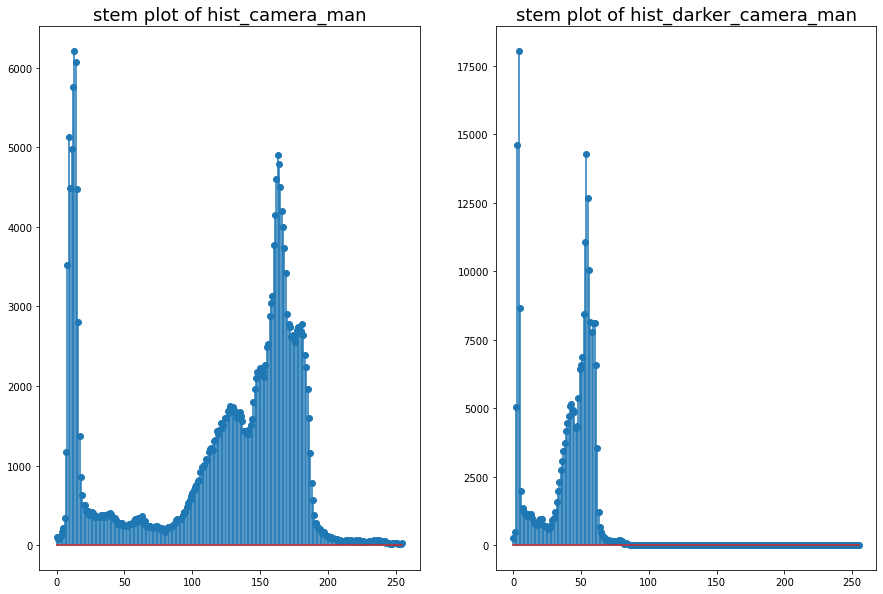

In [54]:
fig = plt.figure(figsize=(15, 10))
fig.add_subplot(1, 2, 1)
plt.title('stem plot of hist_camera_man',fontsize=18)
plt.stem(np.linspace(0,255,256),hist_camera_man)

fig.add_subplot(1, 2, 2)
plt.title('stem plot of hist_darker_camera_man',fontsize=18)
plt.stem(np.linspace(0,255,256),hist_darker_camera_man)

plt.show()

2.1.1.3

In [55]:
def hist_equalization(img):
  #mn = img.shape[0] * img.shape[1]
  hist_img = calculate_histogram(img)
  mn=np.sum(hist_img)
  pdf = hist_img / mn
 # max_intensity = np.max(img)
  max_intensity=255
  out = img.copy()
  cdf = np.cumsum(pdf)
  equalized_gray_levels = np.round_(max_intensity * cdf)
  
  for i in range(0,out.shape[0]):
    for j in range(0,out.shape[1]):
      out[i,j] = equalized_gray_levels[img[i,j]]

  return out    

In [56]:
H = hist_equalization(D)
hist_H = calculate_histogram(H)

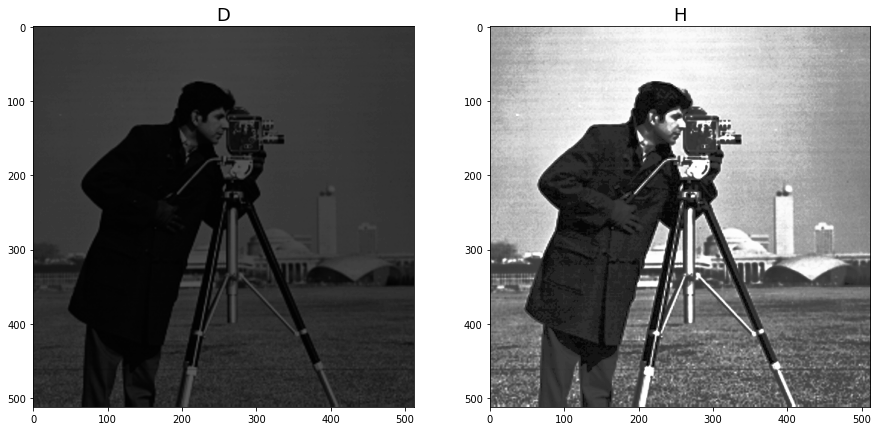

In [57]:
fig = plt.figure(figsize=(15, 10))
fig.add_subplot(1, 2, 1)
plt.title('D',fontsize=18)
plt.imshow(D,cmap='gray')

fig.add_subplot(1, 2, 2)
plt.title('H',fontsize=18)
plt.imshow(H,cmap='gray')

plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  


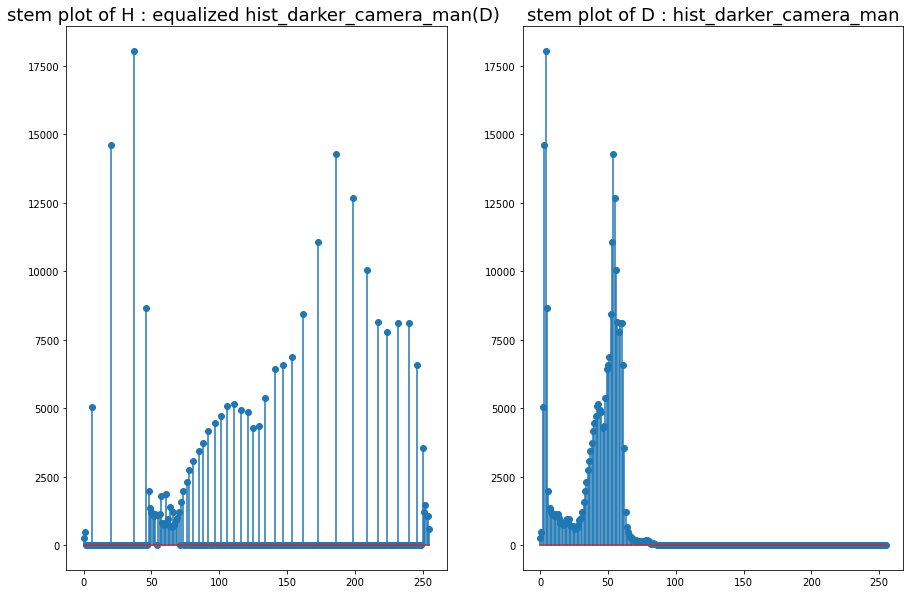

In [58]:
fig = plt.figure(figsize=(15, 10))
fig.add_subplot(1, 2, 1)
plt.title('stem plot of H : equalized hist_darker_camera_man(D) ',fontsize=18)
plt.stem(np.linspace(0,255,256),hist_H)

fig.add_subplot(1, 2, 2)
plt.title('stem plot of D : hist_darker_camera_man',fontsize=18)
plt.stem(np.linspace(0,255,256),hist_darker_camera_man)

plt.show()

2.1.1.4

In [59]:
D.shape

(512, 512)

In [60]:
# def local_hist_equlization(img,window_size):
#   out = img.copy()
#   r_patch = floor(out.shape[0] / window_size)
#   c_patch = floor(out.shape[1] / window_size)

#   for i in range(0,window_size):
#     for j in range(0,window_size):
#       patch = img[i*r_patch:(i+1)*r_patch , j*c_patch:(j+1)*c_patch]
#       out[i*r_patch:(i+1)*r_patch , j*c_patch:(j+1)*c_patch] = hist_equalization(patch)

#   return out

def local_hist_equlization(img,window_size):
  out = img.copy()
  r_patch = floor(out.shape[0] / window_size)
  c_patch = floor(out.shape[1] / window_size)

  for i in range(0,r_patch):
    for j in range(0,c_patch):
      patch = img[i*window_size:(i+1)*window_size , j*window_size:(j+1)*window_size]
      out[i*window_size:(i+1)*window_size , j*window_size:(j+1)*window_size] = hist_equalization(patch)

  return out

In [61]:
L = local_hist_equlization(D,32) # 1/16  of 512

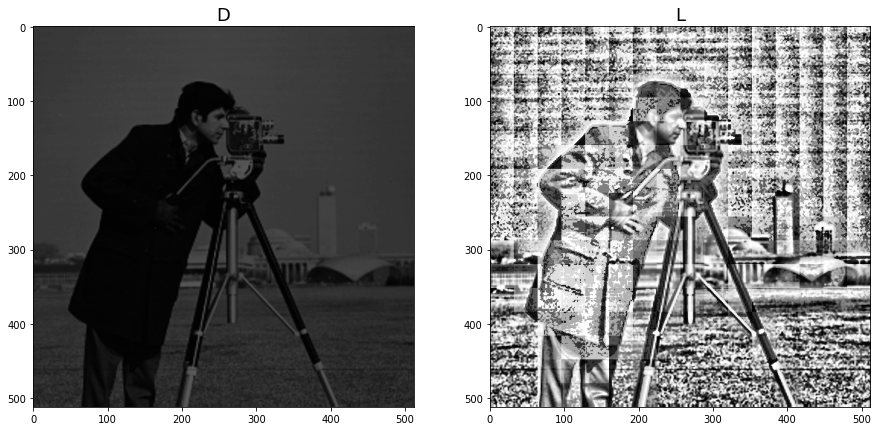

In [62]:
fig = plt.figure(figsize=(15, 10))
fig.add_subplot(1, 2, 1)
plt.title('D',fontsize=18)
plt.imshow(D,cmap='gray')

fig.add_subplot(1, 2, 2)
plt.title('L',fontsize=18)
plt.imshow(L,cmap='gray')

plt.show()

2.1.1.5

In [63]:
hist_L = calculate_histogram(L)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  


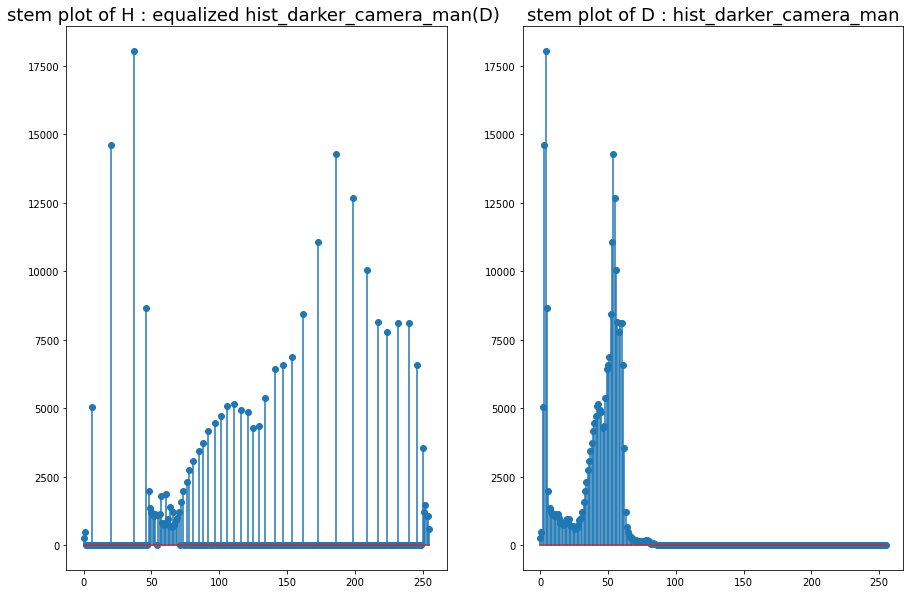

In [64]:
fig = plt.figure(figsize=(15, 10))
fig.add_subplot(1, 2, 1)
plt.title('stem plot of H : equalized hist_darker_camera_man(D) ',fontsize=18)
plt.stem(np.linspace(0,255,256),hist_H)

fig.add_subplot(1, 2, 2)
plt.title('stem plot of D : hist_darker_camera_man',fontsize=18)
plt.stem(np.linspace(0,255,256),hist_darker_camera_man)

plt.show()

2.1.1.6

In [65]:
def log_transform(img):  # s = c log(r+1)   # 255/log(r_max +1)
  r_max = np.max(img)
  c = 255/log(r_max +1)
  out = img.copy()
  out = c * np.log(img+1)
  return out.astype('int32')

In [66]:
log_transformed_D=log_transform(D)
hist_log_transformed_D = calculate_histogram(log_transformed_D)

In [67]:
(log_transformed_D.shape)

(512, 512)

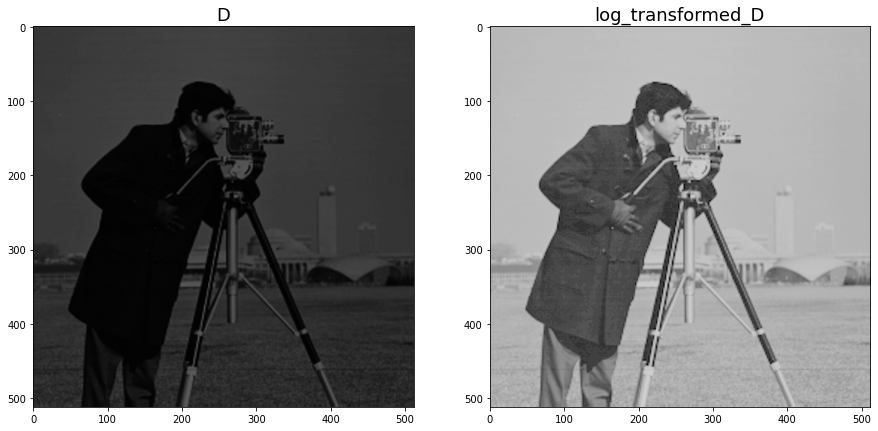

In [68]:
fig = plt.figure(figsize=(15, 10))
fig.add_subplot(1, 2, 1)
plt.title('D',fontsize=18)
plt.imshow(D,cmap='gray')

fig.add_subplot(1, 2, 2)
plt.title('log_transformed_D',fontsize=18)
plt.imshow(log_transformed_D,cmap='gray')

plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  


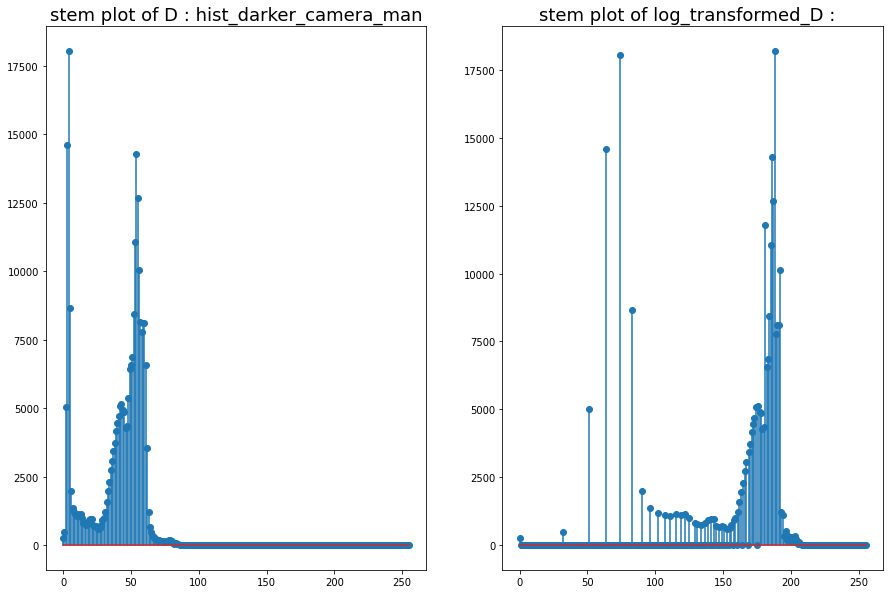

In [69]:
fig = plt.figure(figsize=(15, 10))
fig.add_subplot(1, 2, 1)
plt.title('stem plot of D : hist_darker_camera_man',fontsize=18)
plt.stem(np.linspace(0,255,256),hist_darker_camera_man)

fig.add_subplot(1, 2, 2)
plt.title('stem plot of log_transformed_D :  ',fontsize=18)
plt.stem(np.linspace(0,255,256),hist_log_transformed_D)

plt.show()

In [70]:
def inverse_log_transform(img): # s = c (b^r -1)   c = 255 / (b^r_max -1 )
  b = 1.02   #based on https://subscription.packtpub.com/book/application-development/9781784391454/1/ch01lvl1sec16/logarithmic-transformations
  
  r_max = np.max(img)
  c = 255.0 / (pow(b,r_max) - 1)
  out = img.copy()
  out = c * (np.power(b,img) - 1)
  return out.astype('int32')

In [71]:
inverse_log_transformed_D=inverse_log_transform(D)
hist_inverse_log_transformed_D = calculate_histogram(inverse_log_transformed_D)

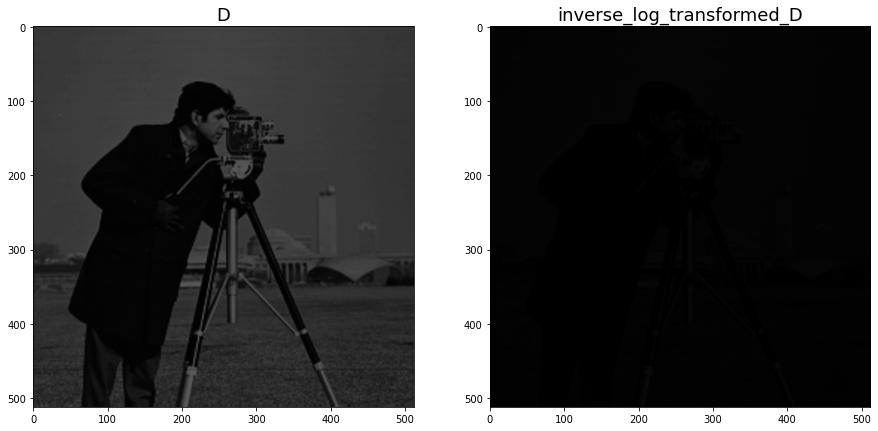

In [72]:
fig = plt.figure(figsize=(15, 10))
fig.add_subplot(1, 2, 1)
plt.title('D',fontsize=18)
plt.imshow(D,cmap='gray')

fig.add_subplot(1, 2, 2)
plt.title('inverse_log_transformed_D',fontsize=18)
plt.imshow(inverse_log_transformed_D,cmap='gray')

plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  


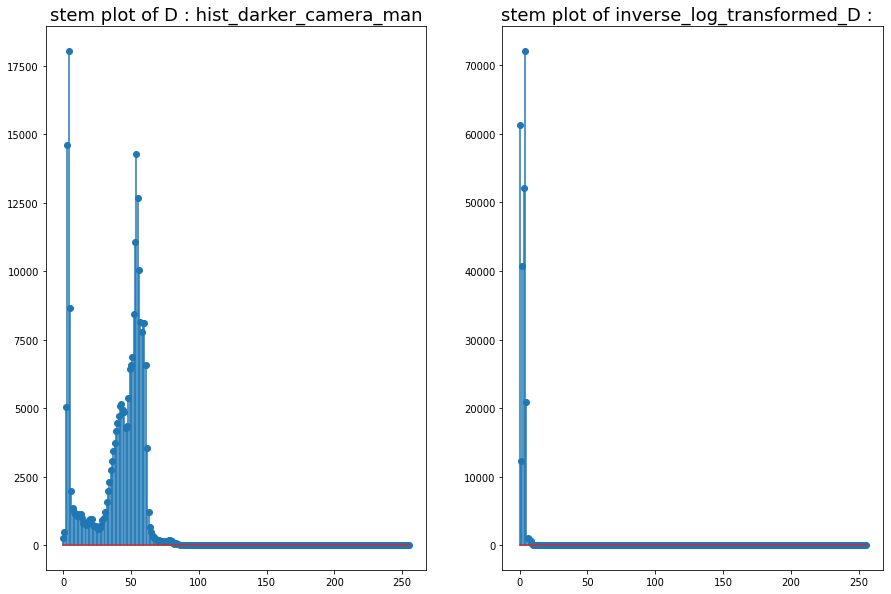

In [73]:
fig = plt.figure(figsize=(15, 10))
fig.add_subplot(1, 2, 1)
plt.title('stem plot of D : hist_darker_camera_man',fontsize=18)
plt.stem(np.linspace(0,255,256),hist_darker_camera_man)

fig.add_subplot(1, 2, 2)
plt.title('stem plot of inverse_log_transformed_D :  ',fontsize=18)
plt.stem(np.linspace(0,255,256),hist_inverse_log_transformed_D)

plt.show()

In [74]:
def power_low(img,gamma=1):
  out = img.copy()
  out =np.array(255*(img / 255) ** gamma, dtype = 'uint8')
  return out

In [75]:
def show_img(*args, figsize=10, is_gray=True, title=None, fontsize=12):
  
  if isinstance(figsize, int):
    figsize = (figsize, figsize)
  images = args[0] if type(args[0]) is list else list(args)
  cmap=None
  if not is_gray:
    images = list(map(lambda x: cv2.cvtColor(x, cv2.COLOR_BGR2RGB), images))
  else:
    cmap = 'gray'
  plt.figure(figsize=figsize)
  for i in range(1, len(images)+1):
    plt.subplot(1, len(images), i)
    if title is not None:
      plt.title(title[i-1], fontsize=fontsize)
    
    plt.imshow(images[i-1], cmap=cmap)
    plt.axis('off')

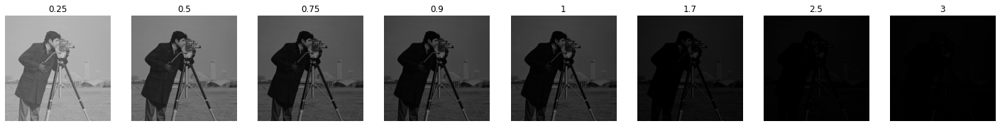

In [76]:
power_law_transformed_D = []
gamma = [0.25, 0.5, 0.75, 0.9,1,1.7,2.5,3]
for i in gamma:
  power_law_transformed_D.append(power_low(D, gamma=i))
show_img(power_law_transformed_D, figsize=25, title=gamma)

2.1.2

In [77]:
camera_man_equalized=hist_equalization(camera_man_img)
hist_camera_man_equalized = calculate_histogram(camera_man_equalized)

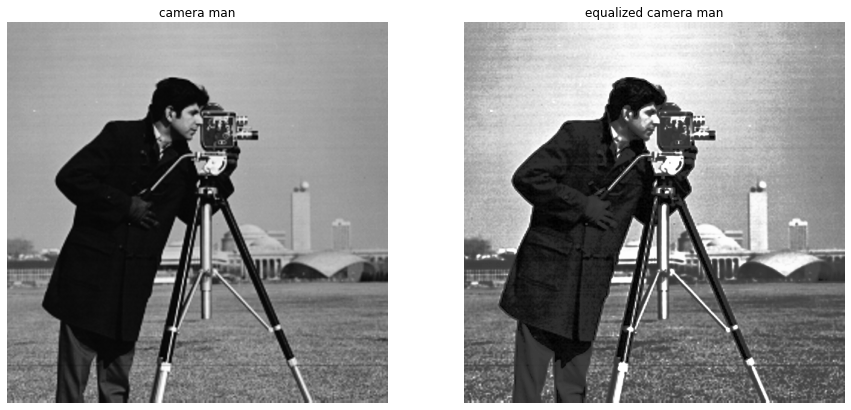

In [78]:
show_img(camera_man_img, camera_man_equalized, title=['camera man', 'equalized camera man'], figsize=15)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  


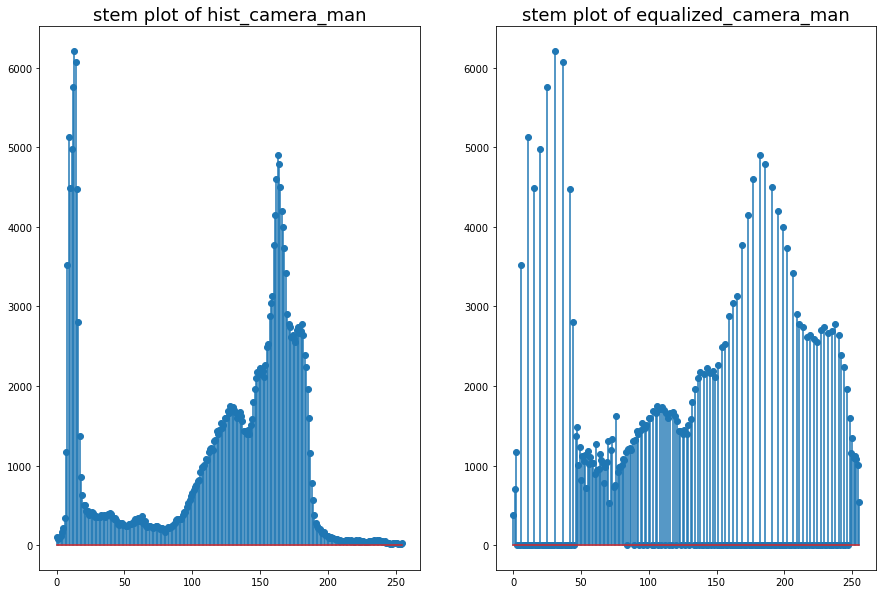

In [79]:
fig = plt.figure(figsize=(15, 10))
fig.add_subplot(1, 2, 1)
plt.title('stem plot of hist_camera_man',fontsize=18)
plt.stem(np.linspace(0,255,256),hist_camera_man)

fig.add_subplot(1, 2, 2)
plt.title('stem plot of equalized_camera_man',fontsize=18)
plt.stem(np.linspace(0,255,256),hist_camera_man_equalized)

plt.show()

2.1.3

In [80]:
def imadjust(img,low_out=0,high_out=1,gamma=1):
  low_in = np.min(img)
  high_in = np.max(img)
  out =(((img - low_in) / (high_in - low_in))**gamma) * (high_out - low_out) + low_out
  return out.astype('uint8')

In [81]:
in_out_bounds=[(24,64),(32,196),(16,232),(0,255)]
imadjs = []
titles=[]
for (l,h) in in_out_bounds:
  #titles.append(f'low boundray {l} boundry {h}')
  imadjs.append(imadjust(camera_man_img,l,h))


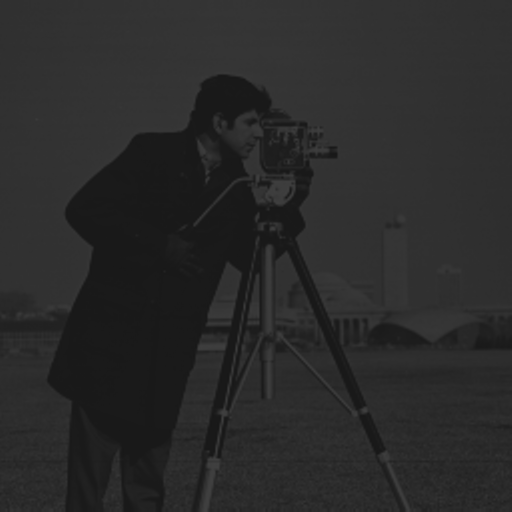

In [82]:
from google.colab.patches import cv2_imshow
cv2_imshow(imadjs[0])

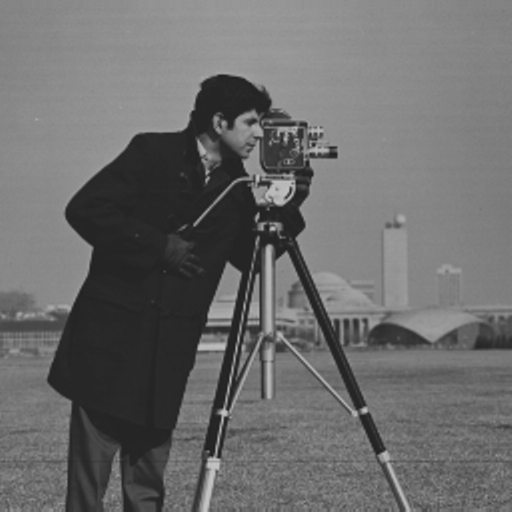

In [83]:
cv2_imshow(imadjs[1])

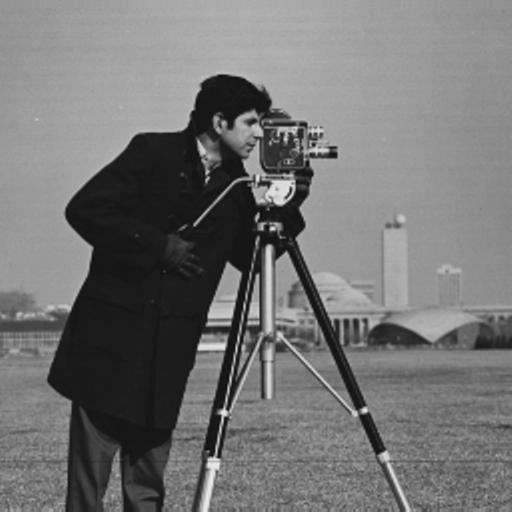

In [84]:
cv2_imshow(imadjs[2])

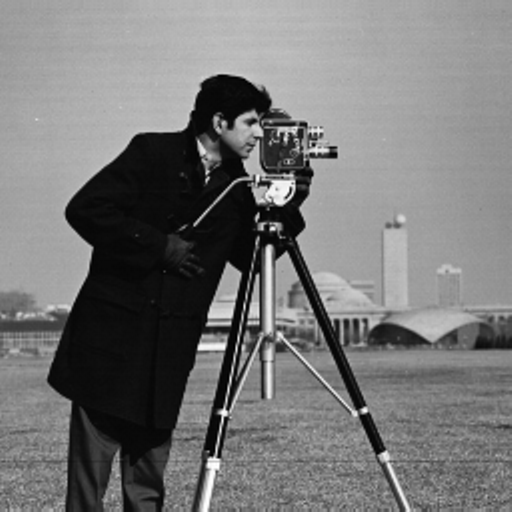

In [85]:
cv2_imshow(imadjs[3])

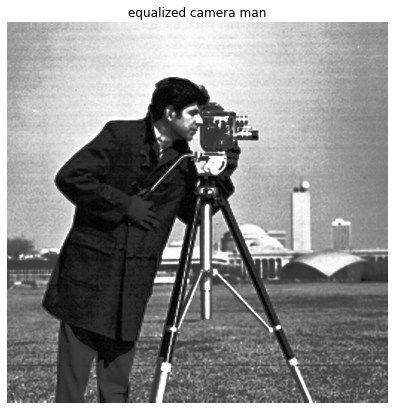

In [86]:
show_img(camera_man_equalized, title=['equalized camera man'], figsize=7)

2.2

2.2.1

In [87]:
he1 = cv2.imread('HE1.jpg',cv2.IMREAD_GRAYSCALE)
he2 = cv2.imread('HE2.jpg',cv2.IMREAD_GRAYSCALE)
he3= cv2.imread('HE3.jpg',cv2.IMREAD_GRAYSCALE)
he4= cv2.imread('HE4.jpg',cv2.IMREAD_GRAYSCALE)

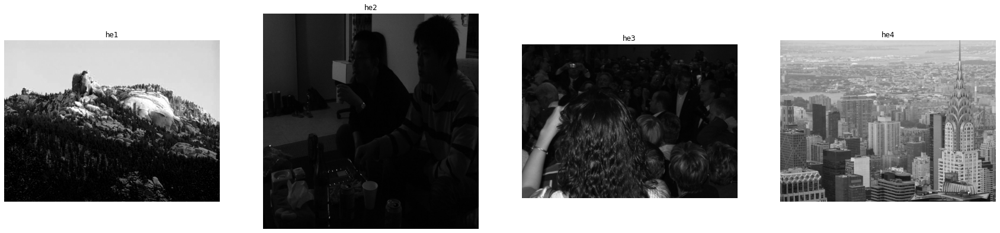

In [88]:
show_img(he1,he2,he3,he4 ,title=['he1','he2','he3','he4'], figsize=30)

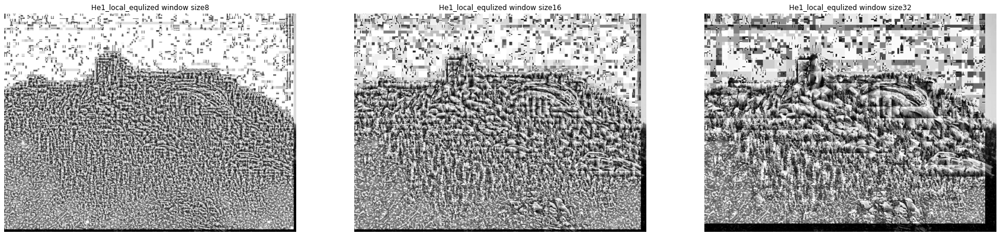

In [89]:
he1_local_equlization_list=[]
titles=[]
for w in [8,16,32]:
   he1_local_equlized= local_hist_equlization(he1,w)
   he1_local_equlization_list.append(he1_local_equlized)
   titles.append(f'He1_local_equlized window size{w}')
show_img(he1_local_equlization_list,title=titles, figsize=30)   

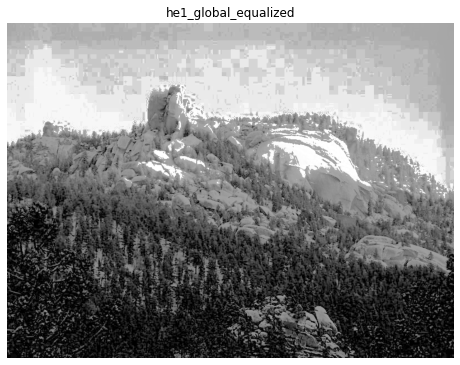

In [90]:
he1_global_equalized=hist_equalization(he1)
show_img(he1_global_equalized, title=['he1_global_equalized'], figsize=8)

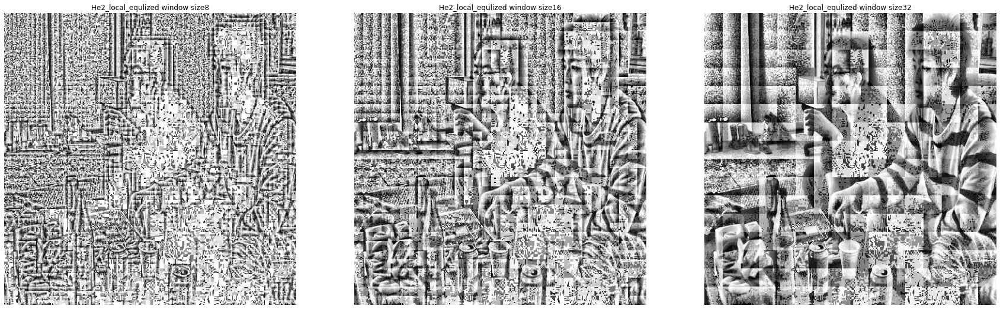

In [91]:
he2_local_equlization_list=[]
titles=[]
for w in [8,16,32]:
   he2_local_equlized= local_hist_equlization(he2,w)
   he2_local_equlization_list.append(he2_local_equlized)
   titles.append(f'He2_local_equlized window size{w}')
show_img(he2_local_equlization_list,title=titles, figsize=30)  

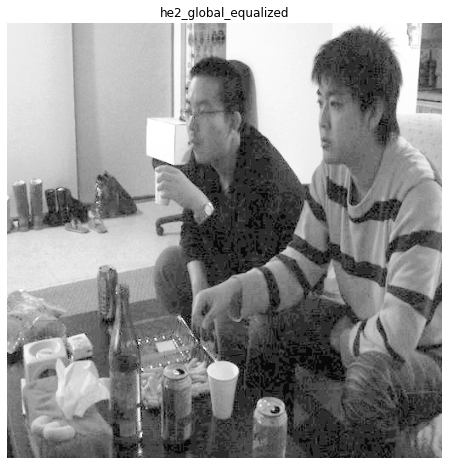

In [92]:
he2_global_equalized=hist_equalization(he2)
show_img(he2_global_equalized, title=['he2_global_equalized'], figsize=8)

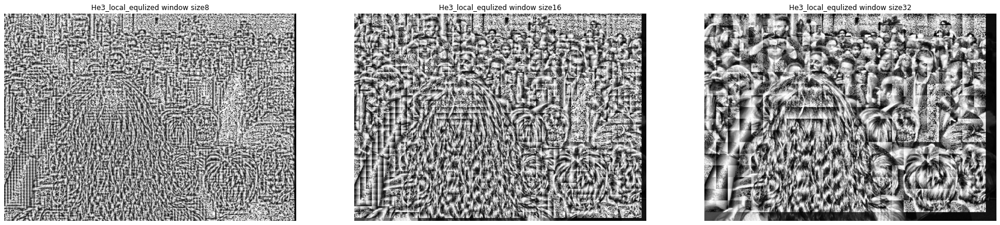

In [93]:
he3_local_equlization_list=[]
titles=[]
for w in [8,16,32]:
   he3_local_equlized= local_hist_equlization(he3,w)
   he3_local_equlization_list.append(he3_local_equlized)
   titles.append(f'He3_local_equlized window size{w}')
show_img(he3_local_equlization_list,title=titles, figsize=30)  

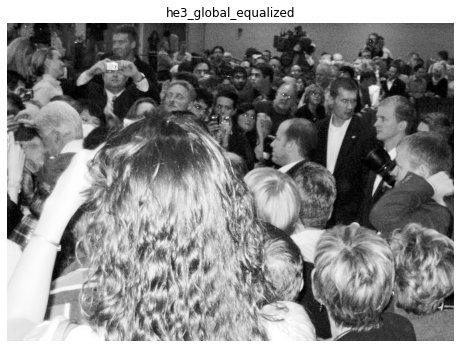

In [94]:
he3_global_equalized=hist_equalization(he3)
show_img(he3_global_equalized, title=['he3_global_equalized'], figsize=8)

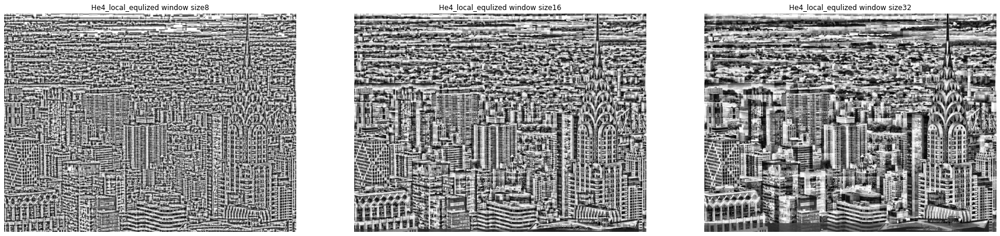

In [95]:
he4_local_equlization_list=[]
titles=[]
for w in [8,16,32]:
   he4_local_equlized= local_hist_equlization(he4,w)
   he4_local_equlization_list.append(he4_local_equlized)
   titles.append(f'He4_local_equlized window size{w}')
show_img(he4_local_equlization_list,title=titles, figsize=30)  

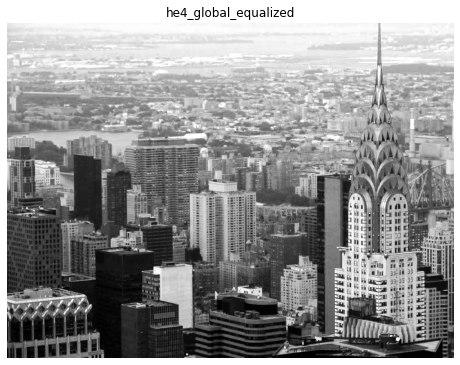

In [96]:
he4_global_equalized=hist_equalization(he4)
show_img(he4_global_equalized, title=['he4_global_equalized'], figsize=8)